# Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#plt.rcParams['figure.figsize'] = [10, 5]
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
import missingno as msno
import pandas_profiling
from scipy.spatial import distance
%matplotlib inline

!python --version

Python 3.6.5


# Functions

In [3]:
def show_full_data(data, row_size=None, column_size=None):
    """Shows all rows and columns instead of showing only some part and hiding other parts for large data.
    """
    with pd.option_context('display.max_rows', row_size, 'display.max_columns', column_size):
        display(data)

In [4]:
# Groups data by the group_var and calculates mean, max, min, var and sum. 
# This will only be applied to numeric data by default in pandas.
# Taken from Will Koehrsen and modified.
def agg_numeric(df, group_var, df_name):
    """Aggregates the numeric values in a dataframe. This can
    be used to create features for each instance of the grouping variable.
    
    Parameters
    --------
        df (dataframe): 
            the dataframe to calculate the statistics on
        group_var (string): 
            the variable by which to group df
        df_name (string): 
            the variable used to rename the columns
        
    Return
    --------
        agg (dataframe): 
            a dataframe with the statistics aggregated for 
            all numeric columns. Each instance of the grouping variable will have 
            the statistics (mean, min, max, sum; currently supported) calculated. 
            The columns are also renamed to keep track of features created.
    
    """
    # Remove id variables other than grouping variable
    for col in df:
        if col != group_var and 'SK_ID' in col:
            df = df.drop(columns = col)
            
    group_ids = df[group_var]
    numeric_df = df.select_dtypes('number')
    numeric_df[group_var] = group_ids

    # Group by the specified variable and calculate the statistics
    agg = numeric_df.groupby(group_var).agg(['count', 'mean', 'max', 'min', 'var', 'sum']).reset_index()

    # Need to create new column names
    columns = [group_var]

    # Iterate through the variables names
    for var in agg.columns.levels[0]:
        # Skip the grouping variable
        if var != group_var:
            # Iterate through the stat names
            for stat in agg.columns.levels[1][:-1]:
                # Make a new column name for the variable and stat
                columns.append('%s_%s_%s' % (df_name, var, stat))

    agg.columns = columns
    return agg

In [5]:
# This function calculates the occurrences (counts) of each category in a categorical variable for each client. 
# It also calculates the normed count, which is the count for a category divided by the 
# total counts for all categories in a categorical variable.
def count_categorical(df, group_var, df_name):
    """Computes counts and normalized counts for each observation
    of `group_var` of each unique category in every categorical variable
    
    Parameters
    --------
    df : dataframe 
        The dataframe to calculate the value counts for.
        
    group_var : string
        The variable by which to group the dataframe. For each unique
        value of this variable, the final dataframe will have one row
        
    df_name : string
        Variable added to the front of column names to keep track of columns

    
    Return
    --------
    categorical : dataframe
        A dataframe with counts and normalized counts of each unique category in every categorical variable
        with one row for every unique value of the `group_var`.
        
    """
    
    # Select the categorical columns
    categorical = pd.get_dummies(df.select_dtypes('object'))

    # Make sure to put the identifying id on the column
    categorical[group_var] = df[group_var]

    # Groupby the group var and calculate the sum and mean
    categorical = categorical.groupby(group_var).agg(['sum', 'mean'])
    
    column_names = []
    
    # Iterate through the columns in level 0
    for var in categorical.columns.levels[0]:
        # Iterate through the stats in level 1
        for stat in ['count', 'count_norm']:
            # Make a new column name
            column_names.append('%s_%s_%s' % (df_name, var, stat))
    
    categorical.columns = column_names
    
    return categorical

In [6]:
def edited_features(dfs, group_var, df_names, corr_tresh):
    """Calls agg_numeric and count_categorical functions to calculate all numeric and categorical
    features and merge them to create feature set. Lastly, it removes highly correlated features
    according to correlation treshold.
    
    Parameters
    --------
    dfs : list
        The list of dataframes to add new features
        
    group_var : string
        The variable by which to group the dataframe. For each unique
        value of this variable, the final dataframe will have one row
        
    df_names : list
        List of variables added to the front of column names to keep track of columns
        
    corr_tresh : string
        Correlation treshold to remove unnecessary features from created dataset

    
    Return
    --------
    featureset : dataframe
        Train and test dataframes which includes created features with one row for every unique value 
        of the `group_var`.
        
    """    
    count = 0
    
    # Creating new feature set from different datasets
    for df in dfs:
        df_name = df_names[count]
        # Calculate aggregate statistics for each numeric column
        new_df = agg_numeric(df, group_var, df_name)
        print('Shape of aggregated data of ' + df_name + ': ', new_df.shape)
        
        cat_mask = (df.dtypes == 'category') | (df.dtypes == 'object') | (df.dtypes == 'bool')
        if df.dtypes[cat_mask].shape[0] > 0:
            # Calculate value counts for each categorical column
            df_counts = count_categorical(df, group_var, df_name).reset_index()
            print('Shape of grouped categorical data of ' + df_name + ': ', df_counts.shape)

            # Merge aggregated and grouped categorical features 
            new_df = new_df.merge(df_counts, on = group_var, how = 'left')
            print('Shape of merged data of ' + df_name + ': ', new_df.shape)

        # Create correlation matrix
        corr_matrix = new_df.corr().abs()

        # Select upper triangle of correlation matrix
        upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

        # Find index of feature columns with correlation greater than corr_tresh
        to_drop = [column for column in upper.columns if any(upper[column] > corr_tresh)]
        
        # Drop features 
        new_df.drop(columns=to_drop, axis=1, inplace=True)
        print('Shape of merged data after drop: ', new_df.shape)
        
        if count == 0:
            featureset = new_df.copy()
            print('in first if')
        else:
            featureset = featureset.merge(new_df, on=group_var, how='left')
            print('in else')
        count = count + 1
        print('Featureset shape for ' + str(count) + '. round: ', featureset.shape)
    
    count = 0
    print('Shape of created featureset: ', featureset.shape)
    return featureset

# Read Data

In [7]:
# List files available
print(os.listdir('input/'))

['application_test.csv', 'HomeCredit_columns_description.csv', 'POS_CASH_balance.csv', 'credit_card_balance.csv', 'HomeCredit_columns_description.xlsx', 'installments_payments.csv', 'application_train.csv', 'bureau.csv', 'previous_application.csv', 'bureau_balance.csv', 'sample_submission.csv']


In [8]:
train = pd.read_csv('input/application_train.csv')
test = pd.read_csv('input/application_test.csv')
bureau = pd.read_csv('input/bureau.csv')
bureau_balance = pd.read_csv('input/bureau_balance.csv')
previous = pd.read_csv('input/previous_application.csv')
pos_cash_balance = pd.read_csv('input/POS_CASH_balance.csv')
credit_card = pd.read_csv('input/credit_card_balance.csv')
installments = pd.read_csv('input/installments_payments.csv')

# Application Data Exploration

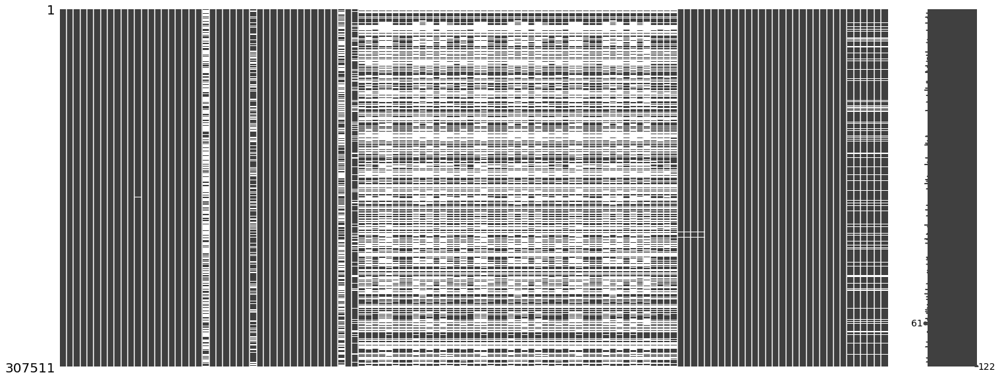

In [9]:
# Missing data distribution on dataframe.
msno.matrix(train)

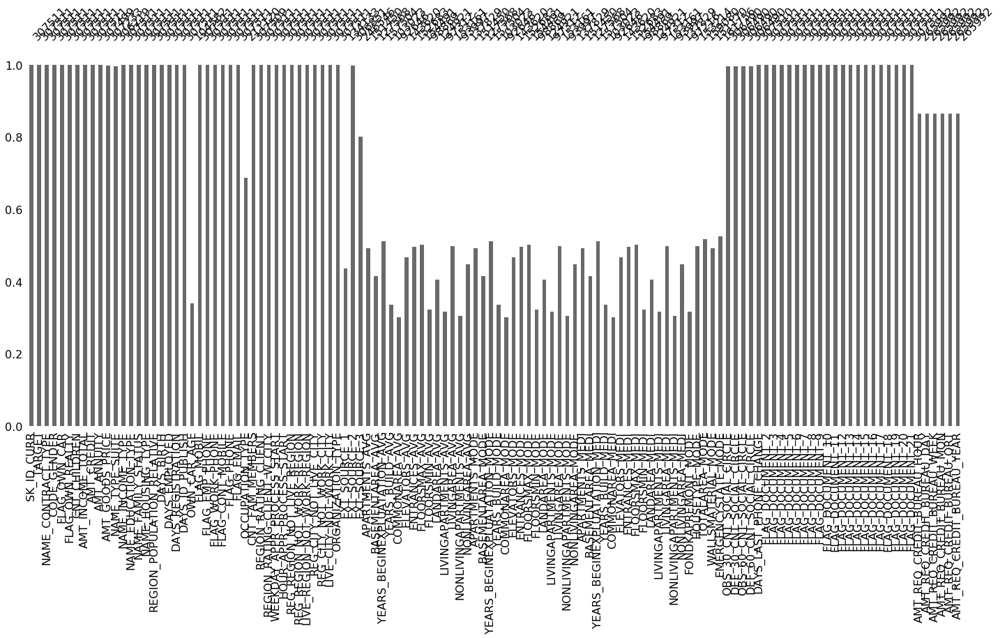

In [10]:
# Missing and non-missing data percentages. The bars on the graph shows non-missing values percentages.
msno.bar(train)

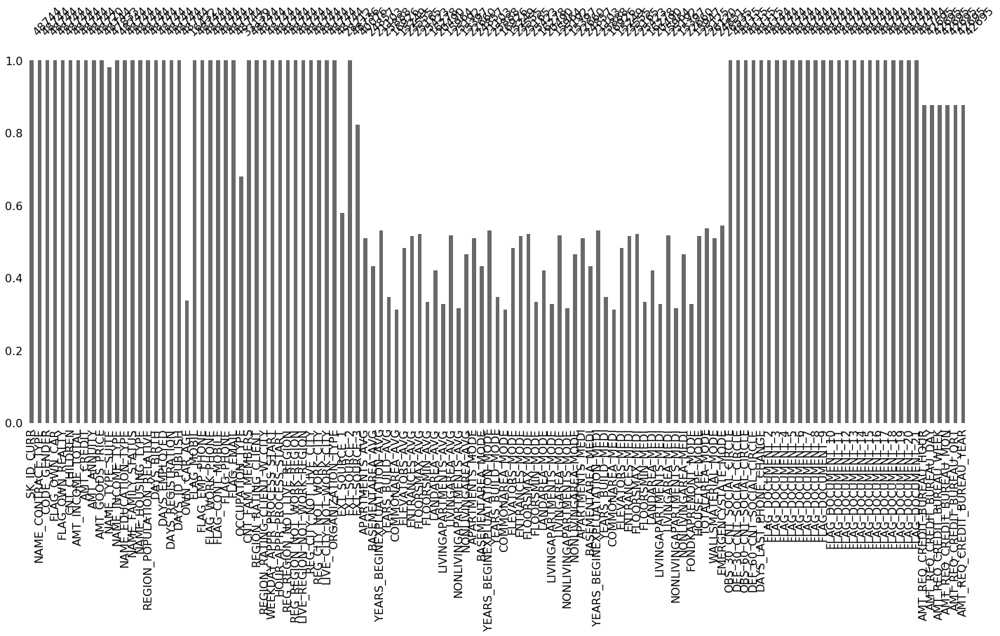

In [11]:
msno.bar(test)

As we can see that there are some features that has a lot of missing values.
The missing value percentages for each feature are similar in train and test data.
Because of we cannot train our model with missing data, we need to find the reason of these missing values.

In [12]:
# Descriptive statistics for each feature.
pandas_profiling.ProfileReport(train, check_correlation=False)

Number of variables,122
Number of observations,307511
Total Missing (%),24.4%
Total size in memory,286.2 MiB
Average record size in memory,976.0 B
Numeric,73
Categorical,16
Boolean,33
Date,0
Text (Unique),0
Rejected,0


In [13]:
pandas_profiling.ProfileReport(test, check_correlation=False)

Number of variables,121
Number of observations,48744
Total Missing (%),23.8%
Total size in memory,45.0 MiB
Average record size in memory,968.0 B
Numeric,73
Categorical,16
Boolean,21
Date,0
Text (Unique),0
Rejected,11


- DAYS_EMPLOYED has a lot of 365243.  
- There are a lot of NaN OCCUPATION_TYPE values.  
- There ara some highly skewed features, it may be good to use transformations (e.g. log) to fit in normal like distributions.  
- OWN_CAR_AGE has a lot of null values. It may be connected with FLAG_OWN_CAR, because if anybody does not have a car, they cannot have a car age. 
- Some values has a lot of zeros (zeros in test data may not matter because they could be about sampling). Uninformable features which contains a lot of zeros should be dropped.

In [14]:
# Number of unique classes in each object column
train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

ORGANIZATION_TYPE has a lot of categories. 58 features will be extracted from it. 
Therefore, categories which have less data may not contribute too much for learning algorithm. 
However, during feature selection and dimensionality reduction process, these problems can be eliminated.

## Fixing Problems

### OCCUPATION_TYPE and DAYS_EMPLOYED Problem

#### Train Data

In [15]:
# Number of missing data of train
print('Number of missing data of OCCUPATION_TYPE: ', len(train[train.OCCUPATION_TYPE.isnull()]))
print('Number of (DAYS_EMPLOYED = 365243): ', len(train[train.DAYS_EMPLOYED == 365243]))

Number of missing data of OCCUPATION_TYPE:  96391
Number of (DAYS_EMPLOYED = 365243):  55374


In [16]:
train[(train.DAYS_EMPLOYED == 365243) | (train.OCCUPATION_TYPE.isnull())][['OCCUPATION_TYPE', 'DAYS_EMPLOYED']].head(10)

,OCCUPATION_TYPE,DAYS_EMPLOYED
8,NaN,365243
11,NaN,365243
23,NaN,365243
28,NaN,-1796
30,NaN,-2668
38,NaN,365243
43,NaN,365243
44,NaN,-758
46,NaN,365243
52,NaN,-778


In [17]:
train[train.DAYS_EMPLOYED == 0]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
23691,127568,0,Cash loans,F,N,N,2,189000.0,983299.5,36571.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,4.0
121625,241013,1,Cash loans,F,N,Y,1,112500.0,134775.0,7438.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0


There is only 2 zeros for DAYS_EMPLOYED. Moreover, there are a lot of intersections between NaN OCCUPATION_TYPE 
and 365243 DAYS_EMPLOYED values. Also, there is no Unemployed OCCUPATION_TYPE. 
We can assume that unemployed people's DAYS_EMPLOYED values are 365243. 

In [18]:
train.loc[train.DAYS_EMPLOYED == 365243, 'OCCUPATION_TYPE'] = 'Unemployed'
train.OCCUPATION_TYPE = train.OCCUPATION_TYPE.fillna('Not_Answered')
train.loc[train.DAYS_EMPLOYED == 365243, 'DAYS_EMPLOYED'] = 0

Other than unemployed categories, there are a lot of NaN values for OCCUPATION_TYPE. 
We can assume that these IDs did not filled OCCUPATION_TYPES so other NaN values can be filled with Not_Answered to create another category.

In [19]:
# Number of missing data of train
print('Number of missing data of OCCUPATION_TYPE: ', len(train[train.OCCUPATION_TYPE.isnull()]))
print('Missing or equal to 365243 data of DAYS_EMPLOYED: ', len(train[train.DAYS_EMPLOYED == 365243]) + len(train[train.DAYS_EMPLOYED.isnull()]))

Number of missing data of OCCUPATION_TYPE:  0
Missing or equal to 365243 data of DAYS_EMPLOYED:  0


#### Test Data

In [20]:
# Number of missing data of test
print('Number of missing data of OCCUPATION_TYPE: ', len(test[test.OCCUPATION_TYPE.isnull()]))
print('Number of missing data of DAYS_EMPLOYED: ', len(test[test.DAYS_EMPLOYED == 365243]))

Number of missing data of OCCUPATION_TYPE:  15605
Number of missing data of DAYS_EMPLOYED:  9274


In [21]:
test[(test.DAYS_EMPLOYED == 365243) | (test.OCCUPATION_TYPE.isnull())][['OCCUPATION_TYPE', 'DAYS_EMPLOYED']].head(10)

,OCCUPATION_TYPE,DAYS_EMPLOYED
0,NaN,-2329
4,NaN,-2191
10,NaN,365243
12,NaN,-929
17,NaN,365243
21,NaN,-13294
22,NaN,365243
26,NaN,365243
27,NaN,-2467
29,NaN,-2785


In [22]:
test.loc[test.DAYS_EMPLOYED == 365243, 'OCCUPATION_TYPE'] = 'Unemployed'
test.OCCUPATION_TYPE = test.OCCUPATION_TYPE.fillna('Not_Answered')
test.loc[test.DAYS_EMPLOYED == 365243, 'DAYS_EMPLOYED'] = 0

In [23]:
# Number of missing data of test
print('Number of missing data of OCCUPATION_TYPE: ', len(test[test.OCCUPATION_TYPE.isnull()]))
print('Missing or equal to 365243 data of DAYS_EMPLOYED: ', len(test[test.DAYS_EMPLOYED == 365243]) + len(test[test.DAYS_EMPLOYED.isnull()]))

Number of missing data of OCCUPATION_TYPE:  0
Missing or equal to 365243 data of DAYS_EMPLOYED:  0


### Exploring EXT_SOURCE data

EXT_SOURCE_1 has a lot of missing values. In this part, I will try to find higly correlated feature with EXT_SOURCE_1.

In [24]:
print(train[train.EXT_SOURCE_1.notnull()]['EXT_SOURCE_1'].shape)
print(train[train.EXT_SOURCE_2.notnull()]['EXT_SOURCE_2'].shape)
print(train[train.EXT_SOURCE_3.notnull()]['EXT_SOURCE_3'].shape)

(134133,)
(306851,)
(246546,)


In [25]:
# Choosing not missing values of every external source train to analyze them.
ext_source_train = train[train.EXT_SOURCE_1.notnull() & train.EXT_SOURCE_2.notnull() & train.EXT_SOURCE_3][['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']]

In [26]:
ext_source_train.corr()

,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3
EXT_SOURCE_1,1.000000,0.206626,0.18676
EXT_SOURCE_2,0.206626,1.000000,0.11524
EXT_SOURCE_3,0.186760,0.115240,1.00000


There is no direct correlation between external source data

In [27]:
# Correlation with other features.
show_full_data(train[train.EXT_SOURCE_1.notnull() & train.EXT_SOURCE_2.notnull() & train.EXT_SOURCE_3.notnull()].corr()[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']])

,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3
SK_ID_CURR,0.001850,0.003098,0.002840
TARGET,-0.154757,-0.144824,-0.173457
CNT_CHILDREN,-0.149286,-0.020055,-0.016412
AMT_INCOME_TOTAL,0.021505,0.033247,-0.022277
AMT_CREDIT,0.158676,0.125840,0.052995
AMT_ANNUITY,0.113148,0.117509,0.036473
AMT_GOODS_PRICE,0.165682,0.132623,0.057144
REGION_POPULATION_RELATIVE,0.095056,0.201806,-0.011839
DAYS_BIRTH,-0.595990,-0.119504,-0.185361
DAYS_EMPLOYED,-0.127229,-0.076652,-0.085308


Could not find any direct correlation except around -0.6 for DAYS_BIRTH and EXT_SOURCE_1.

### FLAG_OWN_CAR and OWN_CAR_AGE Problem

#### Train Data

In [28]:
print(train[train.FLAG_OWN_CAR == 'N'].index.size)
print(train[train.OWN_CAR_AGE.isnull()].index.size)

202924
202929


In [29]:
train.FLAG_OWN_CAR.describe()

count     307511
unique         2
top            N
freq      202924
Name: FLAG_OWN_CAR, dtype: object

In [30]:
# People who owns a car but does not have car age.
mask = (train['OWN_CAR_AGE'].isnull()) & (train['FLAG_OWN_CAR'] == 'Y')
train.ix[mask, ['FLAG_OWN_CAR', 'OWN_CAR_AGE']]

,FLAG_OWN_CAR,OWN_CAR_AGE
30897,Y,NaN
181231,Y,NaN
217549,Y,NaN
229867,Y,NaN
236868,Y,NaN


In [31]:
train[train['OWN_CAR_AGE'].isnull()].shape

(202929, 122)

- Only 5 of 202929 missing OWN_CAR_AGE rows has car already. Therefore, other rows does not have any car so they cannot have a car age. To solve this problem, we need to find a way to express not owning a car.
- Instead of using OWN_CAR_AGE feature, we can create different categories for each age intervals. Therefore, we can also create a category for not owning a car. 

In [32]:
# Creating categories for car ages.
train['OWN_CAR_AGE_CATEGORY'] = pd.cut(train['OWN_CAR_AGE'], [0, 5, 10, 20, 40, 100], labels=['very-new', 'new', 'old', 'very-old', 'antique'])

In [33]:
# Adding new category for not having a car.
train['OWN_CAR_AGE_CATEGORY'].cat.add_categories(['not-have'], inplace=True)

In [34]:
train['OWN_CAR_AGE_CATEGORY'].fillna('not-have', inplace=True)
train.OWN_CAR_AGE_CATEGORY.unique()

[not-have, very-old, old, new, very-new, antique]
Categories (6, object): [very-new < new < old < very-old < antique < not-have]

In [35]:
train['OWN_CAR_AGE_CATEGORY'].dtypes

CategoricalDtype(categories=['very-new', 'new', 'old', 'very-old', 'antique', 'not-have'], ordered=True)

In [36]:
train.drop(columns='OWN_CAR_AGE', inplace=True)
print(train.shape)

(307511, 122)


#### Test Data

In [37]:
test.FLAG_OWN_CAR.describe()

count     48744
unique        2
top           N
freq      32311
Name: FLAG_OWN_CAR, dtype: object

In [38]:
test_mask = (test['OWN_CAR_AGE'].isnull()) & (test['FLAG_OWN_CAR'] == 'Y')
test.ix[test_mask, ['FLAG_OWN_CAR', 'OWN_CAR_AGE']]

,FLAG_OWN_CAR,OWN_CAR_AGE
13007,Y,NaN


In [39]:
test[test['OWN_CAR_AGE'].isnull()].shape

(32312, 121)

In [40]:
test['OWN_CAR_AGE_CATEGORY'] = pd.cut(test['OWN_CAR_AGE'], [0, 5, 10, 20, 40, 100], labels=['very-new', 'new', 'old', 'very-old', 'antique'])
print('Shape after new feature: ', test.shape)
test['OWN_CAR_AGE_CATEGORY'].cat.add_categories(['not-have'], inplace=True)
test['OWN_CAR_AGE_CATEGORY'].fillna('not-have', inplace=True)
print('Unique OWN_CAR_AGE_CATEGORIES: ', test.OWN_CAR_AGE_CATEGORY.unique())
print('test type of new feature: ', test['OWN_CAR_AGE_CATEGORY'].dtypes)
test.drop(columns='OWN_CAR_AGE', inplace=True)
print('Shape after drop OWN_CAR_AGE: ', test.shape)

Shape after new feature:  (48744, 122)
Unique OWN_CAR_AGE_CATEGORIES:  [not-have, very-new, old, new, very-old, antique]
Categories (6, object): [very-new < new < old < very-old < antique < not-have]
test type of new feature:  category
Shape after drop OWN_CAR_AGE:  (48744, 121)


## Adding Manually Extracted Features

Adding some features that could contribute training performance. 

In [41]:
train['CREDIT/INCOME'] = train.AMT_CREDIT / train.AMT_INCOME_TOTAL
train['GOODS/CREDIT'] = train.AMT_GOODS_PRICE / train.AMT_CREDIT
train['BIRTH-EMPLOYED'] = train.DAYS_BIRTH - train.DAYS_EMPLOYED
train['FAMMEMB/INCOME'] = train.CNT_FAM_MEMBERS / train.AMT_INCOME_TOTAL
train['CLIENTREG/INCOME'] = train.REGION_RATING_CLIENT / train.AMT_INCOME_TOTAL
train['CITYREG/INCOME'] = train.REGION_RATING_CLIENT_W_CITY / train.AMT_INCOME_TOTAL
print(train.shape)

(307511, 128)


In [42]:
test['CREDIT/INCOME'] = test.AMT_CREDIT / test.AMT_INCOME_TOTAL
test['GOODS/CREDIT'] = test.AMT_GOODS_PRICE / test.AMT_CREDIT
test['BIRTH-EMPLOYED'] = test.DAYS_BIRTH - test.DAYS_EMPLOYED
test['FAMMEMB/INCOME'] = test.CNT_FAM_MEMBERS / test.AMT_INCOME_TOTAL
test['CLIENTREG/INCOME'] = test.REGION_RATING_CLIENT / test.AMT_INCOME_TOTAL
test['CITYREG/INCOME'] = test.REGION_RATING_CLIENT_W_CITY / test.AMT_INCOME_TOTAL
print(test.shape)

(48744, 127)


## Enumerating Categories

In [43]:
# Save data before enumarating categorical features
train_before_enum_cats = train.copy()
print(train_before_enum_cats.shape)
test_before_enum_cats = test.copy()
print(test_before_enum_cats.shape)

(307511, 128)
(48744, 127)


In [44]:
## Encoding categorical variables

# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in train:
    if train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(train[col].unique())) <= 2:
            # Train on the training train
            le.fit(train[col])
            # Transform both training and testing train
            train[col] = le.transform(train[col])
            test[col] = le.transform(test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1

le_count = le_count + 1
print('%d columns were label encoded.' % le_count)

# one-hot encoding of categorical variables
train = pd.get_dummies(train)
test = pd.get_dummies(test)

print('Training Features shape: ', train.shape)
print('Testing Features shape: ', test.shape)

4 columns were label encoded.
Training Features shape:  (307511, 256)
Testing Features shape:  (48744, 252)


In [45]:
train_labels = train['TARGET']

# Align the training and testing train, keep only columns present in both trainframes
train, test = train.align(test, join = 'inner', axis = 1)

# Add the target back in
train['TARGET'] = train_labels

print('Training Features shape: ', train.shape)
print('Testing Features shape: ', test.shape)

Training Features shape:  (307511, 253)
Testing Features shape:  (48744, 252)


# Creating features from other datasets

## bureau

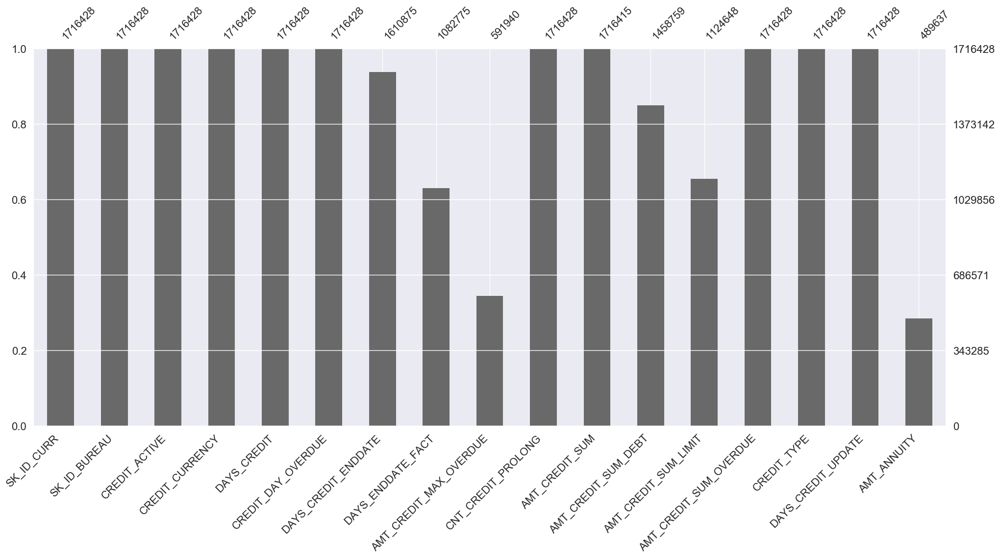

In [46]:
msno.bar(bureau)

In [47]:
pandas_profiling.ProfileReport(bureau, check_correlation=True)

Number of variables,17
Number of observations,1716428
Total Missing (%),13.5%
Total size in memory,222.6 MiB
Average record size in memory,136.0 B
Numeric,14
Categorical,3
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [48]:
pandas_profiling.ProfileReport(bureau[bureau.CREDIT_DAY_OVERDUE > 0], check_correlation=False)

Number of variables,18
Number of observations,4217
Total Missing (%),16.9%
Total size in memory,593.1 KiB
Average record size in memory,144.0 B
Numeric,15
Categorical,2
Boolean,0
Date,0
Text (Unique),0
Rejected,1


- AMT_CREDIT_MAX_OVERDUE has a lot of missing data and non-missing values have a lot of zeros.
- CREDIT_CURRENCY mostly have currency 1.
- AMT_ANNUITY has a lot of missing data.

In [49]:
bureau.drop(columns=['CREDIT_CURRENCY', 'AMT_ANNUITY', 'AMT_CREDIT_MAX_OVERDUE'], inplace=True)
print(bureau.shape)

(1716428, 14)


In [50]:
bureau.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1716428 entries, 0 to 1716427
Data columns (total 14 columns):
SK_ID_CURR                int64
SK_ID_BUREAU              int64
CREDIT_ACTIVE             object
DAYS_CREDIT               int64
CREDIT_DAY_OVERDUE        int64
DAYS_CREDIT_ENDDATE       float64
DAYS_ENDDATE_FACT         float64
CNT_CREDIT_PROLONG        int64
AMT_CREDIT_SUM            float64
AMT_CREDIT_SUM_DEBT       float64
AMT_CREDIT_SUM_LIMIT      float64
AMT_CREDIT_SUM_OVERDUE    float64
CREDIT_TYPE               object
DAYS_CREDIT_UPDATE        int64
dtypes: float64(6), int64(6), object(2)
memory usage: 183.3+ MB


## bureau_balance

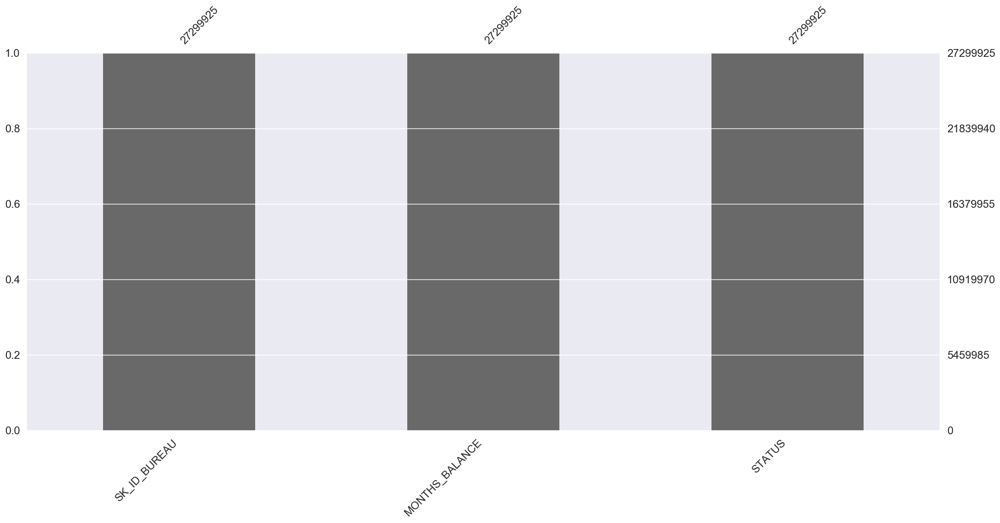

In [51]:
msno.bar(bureau_balance)

In [52]:
pandas_profiling.ProfileReport(bureau_balance, check_correlation=True)

Number of variables,3
Number of observations,27299925
Total Missing (%),0.0%
Total size in memory,624.8 MiB
Average record size in memory,24.0 B
Numeric,2
Categorical,1
Boolean,0
Date,0
Text (Unique),0
Rejected,0


Because of SK_ID_CURR does not exist in bureau_balance, enumerating categories should be done SK_ID_BUREAU firstly. Then, relation with SK_ID_CURR will be used.

In [53]:
# Counts of each type of status for each previous loan
bureau_balance_counts = count_categorical(bureau_balance, group_var = 'SK_ID_BUREAU', df_name = 'bureau_balance')
# Calculate value count statistics for each `SK_ID_CURR` 
bureau_balance_agg = agg_numeric(bureau_balance, group_var = 'SK_ID_BUREAU', df_name = 'bureau_balance')

In [54]:
# Dataframe grouped by the loan
bureau_by_loan = bureau_balance_agg.merge(bureau_balance_counts, right_index = True, left_on = 'SK_ID_BUREAU', how = 'outer')
# Merge to include the SK_ID_CURR
bureau_by_loan = bureau_by_loan.merge(bureau[['SK_ID_BUREAU', 'SK_ID_CURR']], on = 'SK_ID_BUREAU', how = 'left')
bureau_balance_by_client = agg_numeric(bureau_by_loan.drop(columns = ['SK_ID_BUREAU']), group_var = 'SK_ID_CURR', df_name = 'client')
bureau_balance_by_client.head()

,SK_ID_CURR,client_bureau_balance_MONTHS_BALANCE_count_count,client_bureau_balance_MONTHS_BALANCE_count_mean,client_bureau_balance_MONTHS_BALANCE_count_max,client_bureau_balance_MONTHS_BALANCE_count_min,client_bureau_balance_MONTHS_BALANCE_count_var,client_bureau_balance_MONTHS_BALANCE_count_sum,client_bureau_balance_MONTHS_BALANCE_mean_count,client_bureau_balance_MONTHS_BALANCE_mean_mean,client_bureau_balance_MONTHS_BALANCE_mean_max,...,client_bureau_balance_STATUS_X_count_max,client_bureau_balance_STATUS_X_count_min,client_bureau_balance_STATUS_X_count_var,client_bureau_balance_STATUS_X_count_sum,client_bureau_balance_STATUS_X_count_norm_count,client_bureau_balance_STATUS_X_count_norm_mean,client_bureau_balance_STATUS_X_count_norm_max,client_bureau_balance_STATUS_X_count_norm_min,client_bureau_balance_STATUS_X_count_norm_var,client_bureau_balance_STATUS_X_count_norm_sum
0,100001.0,7,24.571429,52,2,257.619048,172,7,-11.785714,-0.5,...,9,0,14.571429,30.0,7,0.214590,0.500000,0.0,0.033347,1.502129
1,100002.0,8,13.750000,22,4,40.500000,110,8,-21.875000,-1.5,...,3,0,1.839286,15.0,8,0.161932,0.500000,0.0,0.026131,1.295455
2,100005.0,3,7.000000,13,3,28.000000,21,3,-3.000000,-1.0,...,1,0,0.333333,2.0,3,0.136752,0.333333,0.0,0.030462,0.410256
3,100010.0,2,36.000000,36,36,0.000000,72,2,-46.000000,-19.5,...,0,0,0.000000,0.0,2,0.000000,0.000000,0.0,0.000000,0.000000
4,100013.0,4,57.500000,69,40,172.333333,230,4,-28.250000,-19.5,...,40,0,393.583333,41.0,4,0.254545,1.000000,0.0,0.247052,1.018182


In [55]:
bureau_balance = bureau_balance_by_client

## previous_application

In [56]:
show_full_data(previous.head(20))

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.000000,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,NaN,315000.0,SATURDAY,8,Y,1,NaN,NaN,NaN,Everyday expenses,Approved,-684,Cash through the bank,XAP,Family,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,18.0,low_normal,Cash X-Sell: low,365243.0,-654.0,-144.0,-144.0,-137.0,1.0
6,2315218,175704,Cash loans,NaN,0.0,0.0,NaN,NaN,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Canceled,-14,XNA,XAP,NaN,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
7,1656711,296299,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Canceled,-21,XNA,XAP,NaN,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
8,2367563,342292,Cash loans,NaN,0.0,0.0,NaN,NaN,MONDAY,15,Y,1,NaN,NaN,NaN,XNA,Canceled,-386,XNA,XAP,NaN,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9,2579447,334349,Cash loans,NaN,0.0,0.0,NaN,NaN,SATURDAY,15,Y,1,NaN,NaN,NaN,XNA,Canceled,-57,XNA,XAP,NaN,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN


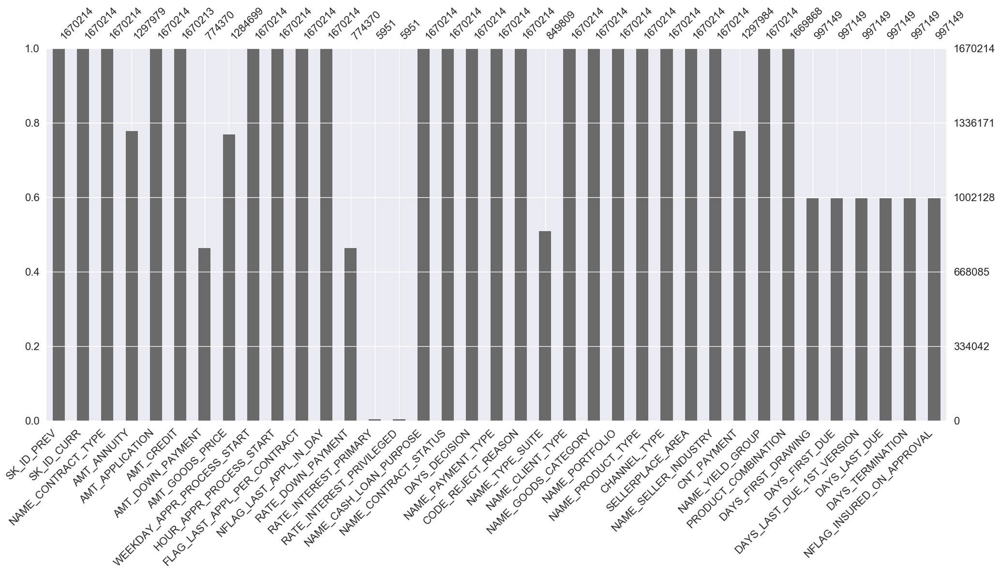

In [57]:
msno.bar(previous)

In [58]:
pandas_profiling.ProfileReport(previous, check_correlation=True)

Number of variables,37
Number of observations,1670214
Total Missing (%),16.3%
Total size in memory,471.5 MiB
Average record size in memory,296.0 B
Numeric,17
Categorical,16
Boolean,1
Date,0
Text (Unique),0
Rejected,3


- AMT_ANNUITY has missing values but they can be filled with zeros because if they do not have previous credit, it should be zero.
- NLAG_LAST_APPL_IN_DAY mostly 1, so it is not a distinguishing feature.

In [59]:
previous['AMT_ANNUITY'].fillna(value=0, inplace=True)
previous.drop(columns=['NFLAG_LAST_APPL_IN_DAY'], inplace=True)
print(previous.shape)

(1670214, 36)


If anyone does not have credit, these features should be zero.

In [60]:
## Fill AMT_DOWN_PAYMENT with zeros if AMT_CREDIT or AMT_APPLICATION is zero.
condition_down_payment = (previous['AMT_CREDIT'] == 0) | (previous['AMT_APPLICATION'] == 0)
previous.ix[condition_down_payment, ['AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'DAYS_FIRST_DRAWING',
                                        'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE',
                                        'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL', 'AMT_ANNUITY',
                                        'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED',
                                        ]] = 0

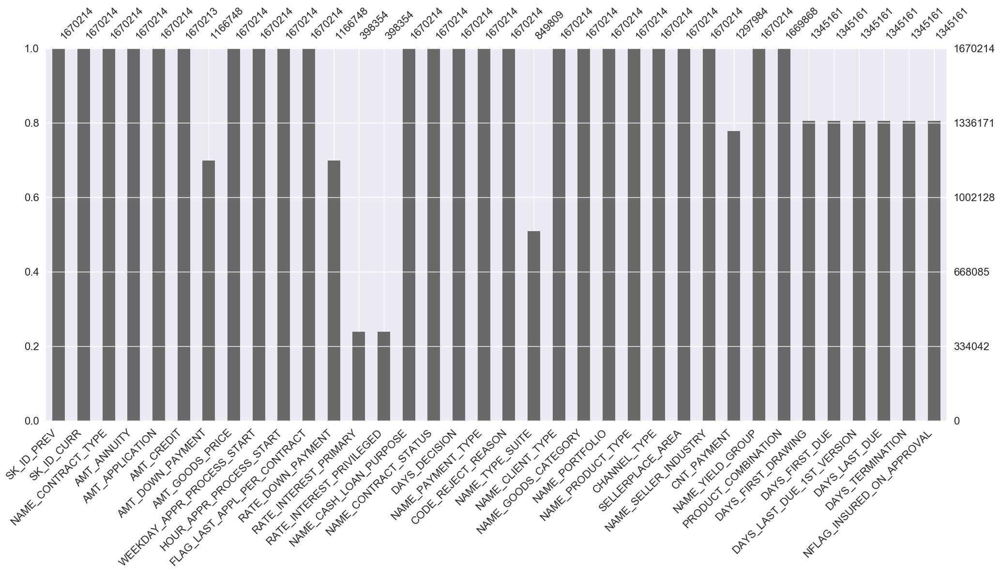

In [61]:
msno.bar(previous)

Drop mostly missing features and add some extracted informative features.

In [62]:
previous.drop(columns=['RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED'], inplace=True)
previous['app/credit'] = previous.AMT_APPLICATION / previous.AMT_CREDIT
previous['goods/credit'] = previous.AMT_GOODS_PRICE / previous.AMT_CREDIT
previous['termination-last_due'] = previous.DAYS_TERMINATION / previous.DAYS_LAST_DUE
print(previous.shape)

(1670214, 37)


## POS_CASH_balance

In [63]:
show_full_data(pos_cash_balance.head(10))

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0
5,2207092,342166,-32,12.0,12.0,Active,0,0
6,1110516,204376,-38,48.0,43.0,Active,0,0
7,1387235,153211,-35,36.0,36.0,Active,0,0
8,1220500,112740,-31,12.0,12.0,Active,0,0
9,2371489,274851,-32,24.0,16.0,Active,0,0


In [64]:
pandas_profiling.ProfileReport(pos_cash_balance, check_correlation=True)

Number of variables,8
Number of observations,10001358
Total Missing (%),0.1%
Total size in memory,610.4 MiB
Average record size in memory,64.0 B
Numeric,7
Categorical,1
Boolean,0
Date,0
Text (Unique),0
Rejected,0


## credit_card_balance

In [65]:
show_full_data(credit_card.head(10))

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.500,0.0,877.500,1700.325,1800.000,1800.000,0.000,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.000,0.0,0.000,2250.000,2250.000,2250.000,60175.080,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.000,0.0,0.000,2250.000,2250.000,2250.000,26926.425,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.000,0.0,0.000,11795.760,11925.000,11925.000,224949.285,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.000,0.0,11547.000,22924.890,27000.000,27000.000,443044.395,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0
5,2646502,380010,-7,82903.815,270000,0.0,0.000,0.0,0.000,4449.105,3825.000,3825.000,80519.040,82773.315,82773.315,0.0,0,0.0,0.0,2.0,Active,7,0
6,1079071,171320,-6,353451.645,585000,67500.0,67500.000,0.0,0.000,14684.175,15750.000,15750.000,345433.860,351881.145,351881.145,1.0,1,0.0,0.0,6.0,Active,0,0
7,2095912,118650,-7,47962.125,45000,45000.0,45000.000,0.0,0.000,0.000,264.690,0.000,44735.310,47962.125,47962.125,1.0,1,0.0,0.0,51.0,Active,0,0
8,2181852,367360,-4,291543.075,292500,90000.0,289339.425,0.0,199339.425,130.500,4093.515,4093.515,285376.410,286831.575,286831.575,3.0,8,0.0,5.0,3.0,Active,0,0
9,1235299,203885,-5,201261.195,225000,76500.0,111026.700,0.0,34526.700,6338.340,45000.000,45000.000,192793.275,197224.695,197224.695,3.0,9,0.0,6.0,38.0,Active,0,0


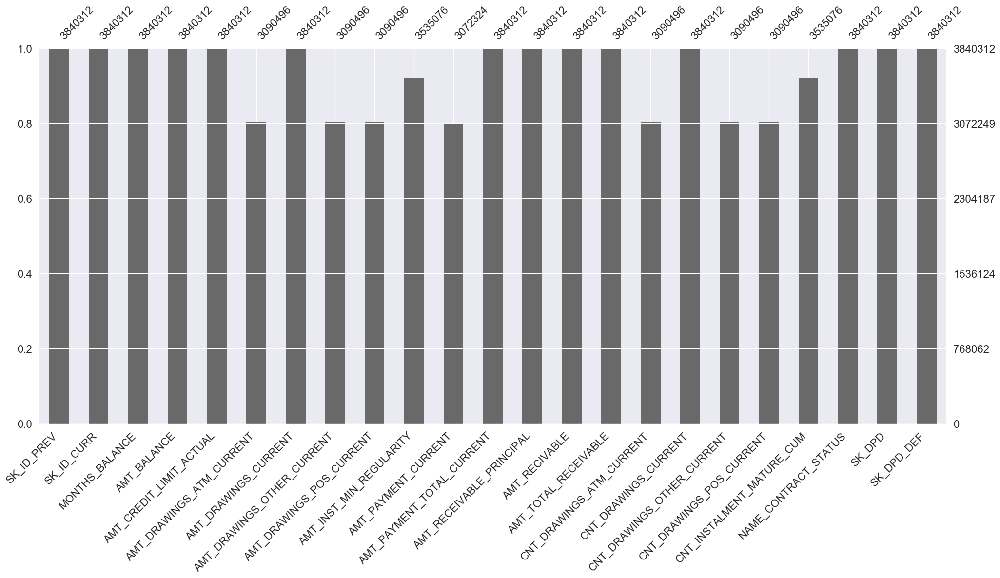

In [66]:
msno.bar(credit_card)

In [67]:
pandas_profiling.ProfileReport(credit_card, check_correlation=True)

Number of variables,23
Number of observations,3840312
Total Missing (%),5.8%
Total size in memory,673.9 MiB
Average record size in memory,184.0 B
Numeric,17
Categorical,1
Boolean,0
Date,0
Text (Unique),0
Rejected,5


These features are highly correlated and should be dropped.

In [68]:
credit_card.drop(columns=['AMT_PAYMENT_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL', 'AMT_RECIVABLE'], axis=1, inplace=True)

## installments_payments

In [69]:
show_full_data(installments.head(10))

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585
5,1137312,164489,1.0,12,-1384.0,-1417.0,5970.375,5970.375
6,2234264,184693,4.0,11,-349.0,-352.0,29432.295,29432.295
7,1818599,111420,2.0,4,-968.0,-994.0,17862.165,17862.165
8,2723183,112102,0.0,14,-197.0,-197.0,70.740,70.740
9,1413990,109741,1.0,4,-570.0,-609.0,14308.470,14308.470


In [70]:
pandas_profiling.ProfileReport(installments, check_correlation=True)

Number of variables,8
Number of observations,13605401
Total Missing (%),0.0%
Total size in memory,830.4 MiB
Average record size in memory,64.0 B
Numeric,6
Categorical,0
Boolean,0
Date,0
Text (Unique),0
Rejected,2


In [71]:
installments['AMT_PAYMENT-INSTALLMENT'] = installments.AMT_PAYMENT - installments.AMT_INSTALMENT
installments['DAYS_PAYMENT-INSTALLMENT'] = installments.DAYS_ENTRY_PAYMENT - installments.DAYS_INSTALMENT
installments.drop(columns=['DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_PAYMENT'], inplace=True)

# Combining all features and creating dataset

In [72]:
featureset = edited_features([bureau, bureau_balance, previous, pos_cash_balance, credit_card, installments], 
                          'SK_ID_CURR', 
                          ['bureau', 'bureau_balance', 'previous', 'pos_cash', 'credit_card', 'installments'], 
                          0.95)
featureset.shape

Shape of aggregated data of bureau:  (305811, 61)
Shape of grouped categorical data of bureau:  (305811, 39)
Shape of merged data of bureau:  (305811, 99)
Shape of merged data after drop:  (305811, 82)
in first if
Featureset shape for 1. round:  (305811, 82)
Shape of aggregated data of bureau_balance:  (134542, 793)
Shape of merged data after drop:  (134542, 343)
in else
Featureset shape for 2. round:  (305811, 424)
Shape of aggregated data of previous:  (338857, 115)
Shape of grouped categorical data of previous:  (338857, 287)
Shape of merged data of previous:  (338857, 401)
Shape of merged data after drop:  (338857, 337)
in else
Featureset shape for 3. round:  (305811, 760)
Shape of aggregated data of pos_cash:  (337252, 31)
Shape of grouped categorical data of pos_cash:  (337252, 19)
Shape of merged data of pos_cash:  (337252, 49)
Shape of merged data after drop:  (337252, 34)
in else
Featureset shape for 4. round:  (305811, 793)
Shape of aggregated data of credit_card:  (103558, 1

(305811, 889)

In [73]:
dataset = train.merge(featureset, on='SK_ID_CURR', how='left')
testset = test.merge(featureset, on='SK_ID_CURR', how='left')
print(dataset.shape)
print(testset.shape)

(307511, 1141)
(48744, 1140)


Removing mostly missing features.

In [74]:
to_remove = dataset.loc[:, (dataset.isnull().sum().sort_values(ascending=False)/len(dataset) > 0.6)].columns.values.tolist()
train_data = dataset.drop(columns=to_remove)
test_data = testset.drop(columns=to_remove)
print(train_data.shape)
print(test_data.shape)

(307511, 714)
(48744, 713)


In [77]:
train_data.to_csv('datasets/train.csv', index=False)
test_data.to_csv('datasets/test.csv', index=False)